[![Open notebook in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/afondiel/computer-vision-challenge/blob/main/L2_03_AI_Powered_Image_Restoration_and_Enhancement/notebooks/AI_Image_Restoration_Enhancement_T5_Inpainting.ipynb)

#  AI Image Restoration and Enhancement: **Inpainting**

### Overview

Reconstruct missing or damaged parts of an image

### Inpainting Pipeline

<img width="1200" height="240" src="https://github.com/afondiel/computer-vision-challenge/blob/main/L2_06_AI_Assisted_Image_Editing_and_Manipulation/docs/pipeline0.png?raw=true">


### Resources

- [Popular Inpainting Datasets](https://paperswithcode.com/datasets?task=image-inpainting)
- **Custom test Dataset:** [afondiel/dummy_images - Hugging Face](https://huggingface.co/datasets/afondiel/dummy_images)
- [SOTA Models for Inpainting](https://paperswithcode.com/task/image-inpainting)
  - Please refer to this [Benchmarking](https://github.com/afondiel/computer-vision-challenge/blob/main/L2_03_AI_Powered_Image_Restoration_and_Enhancement/docs/Image_Restoration_Enhancement_Model_Benchmark.md) to see the top SOTA models for denoising tasks.


> **IMPORTANT:**\
> For the purpose of the entire project ([**Computer Vision Challenge**](https://github.com/afondiel/computer-vision-challenge)), we leverage Pre-trained Model in order to make the project accessible to all, while focusing on the performance and outcome of multiple models.
> - We'll be using pre-trained model from **[Hugging Face Hub](https://huggingface.co/models)** (for stability and safety), Github and other **public python libraries**


### Install dependencies

In [4]:
# Download requirements file
!curl -O https://raw.githubusercontent.com/afondiel/Prompt-Engineering-for-Vision-Models-DeepLearningAI/main/requirements.txt

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   261  100   261    0     0   1344      0 --:--:-- --:--:-- --:--:--  1345


In [5]:
# Hand-crafted libraries
# These resources are originally from this crash course by DLA: https://github.com/afondiel/Prompt-Engineering-for-Vision-Models-DeepLearningAI
# Highly recommended, if you're looking to get some grasp on the art of prompting for Vision Models
!curl -O https://raw.githubusercontent.com/afondiel/computer-vision-challenge/main/L2_03_AI_Powered_Image_Restoration_and_Enhancement/tools/inpainting/utils_im_seg.py
!curl -O https://raw.githubusercontent.com/afondiel/computer-vision-challenge/main/L2_03_AI_Powered_Image_Restoration_and_Enhancement/tools/inpainting/utils_obj_det.py
!curl -O https://raw.githubusercontent.com/afondiel/computer-vision-challenge/main/L2_03_AI_Powered_Image_Restoration_and_Enhancement/tools/inpainting/utils_im_gen.py
!curl -O https://raw.githubusercontent.com/afondiel/computer-vision-challenge/main/L2_03_AI_Powered_Image_Restoration_and_Enhancement/tools/inpainting/utils_fine_tuning.py

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  7693  100  7693    0     0  58261      0 --:--:-- --:--:-- --:--:-- 58280
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  5267  100  5267    0     0  40529      0 --:--:-- --:--:-- --:--:-- 40829
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1809  100  1809    0     0  10470      0 --:--:-- --:--:-- --:--:-- 10517
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 37012  100 37012    0     0   232k      0 --:--:-- --:--:-- --:--:--  233k


In [6]:
# Demo image
!curl -O https://raw.githubusercontent.com/afondiel/computer-vision-challenge/main/L2_03_AI_Powered_Image_Restoration_and_Enhancement/docs/inpainting/dogs.jpg

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1048k  100 1048k    0     0  4417k      0 --:--:-- --:--:-- --:--:-- 4425k


In [7]:
# install dependencies
!pip install -r requirements.txt

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.7 kB)
  Using cached nvidia_nvjitlink_cu12-12.6.20-py3-none-manyl

In [9]:
# Install Hugging Face necessary libraries
# !pip install accelerate transformers gradio datasets -U

In [10]:
# Install pytorch multimodality frameworks & model library
# !pip install torch torchvision torchaudio fastai timm -U
!pip install torchvision torchaudio fastai timm -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 1.9 MB/s eta 0:00:00
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 57.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 797.2/797.2 MB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00
Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.4/209.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 93.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 86.8 MB/s eta 0:00:00
  Attempting uninstall: triton
    Found existing installation: triton 2.2.0
    Uninstalling triton-2.2.0:
      Successfully uninstalled triton-2.2.0
  Attempting uninstall: nvidia-nccl-cu12
    Found existing installation: nvidia-nccl-cu12 2.19.3
    Uninstalling nvidia-nc

In [ ]:
!pip install peft

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.4/296.4 kB 8.5 MB/s eta 0:00:00


In [2]:
# Import necessary libraries
import os
import numpy as np
import torch
# import torchvision
import tensorflow as tf
import cv2
from PIL import Image
import requests
from io import BytesIO
from IPython.display import display
# solve bug cv2.imshow
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# HF libraries & API
from transformers import Pipeline
# from datasets import load_dataset, Dataset, DatasetDict
# from huggingface_hub import notebook_login, login

# Import local libs
from utils_im_seg import *
from utils_obj_det import *
from utils_im_gen import *
# from utils_fine_tuning import *

### Preprocessing and transformations

In [3]:
# Get mask per object
def process_mask_input_boxes(input_boxes, masks, object_id):
  """Processes masks based on object ID."""
  try:
    obj = input_boxes[0][object_id - 1]  # Adjust for zero-based indexing
    print(f"obj{object_id}: {obj}")
    masks, _ = box_prompt(masks, obj)
    return masks
  except IndexError:
    print("Invalid object ID.")
    return None

# Save all the masks objects as masked images
def save_mask(mask, filename):
  plt.imshow(mask, cmap='gray')
  plt.axis('off')
  plt.savefig(filename, bbox_inches='tight', pad_inches=0)
  plt.close() # Close the figure to avoid displaying it

## Object Detection: Getting bounding boxes with [Owl-ViT](https://huggingface.co/google/owlvit-base-patch32)

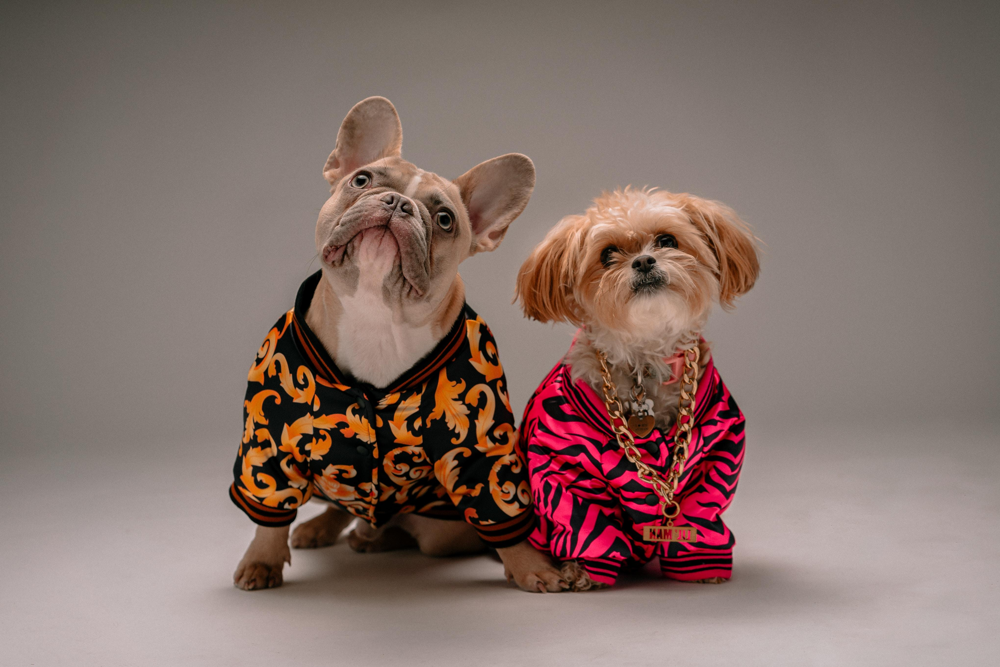

In [4]:
raw_image = "dogs.jpg"
raw_image = Image.open(raw_image)
raw_image

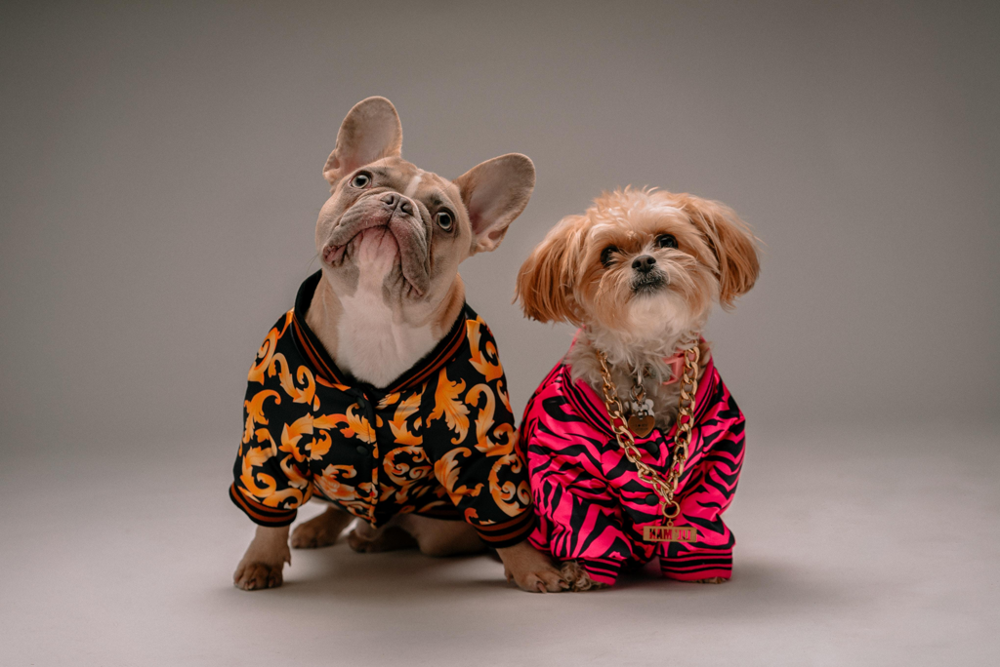

In [5]:
from utils_im_seg import resize_image
resized_image = resize_image(raw_image, input_size=1024)
resized_image

In [6]:
from transformers import pipeline

# OWL-ViT: doc(https://huggingface.co/docs/transformers/main/en/model_doc/owlvit#transformers.OwlViTForObjectDetection)
# OWL_checkpoint = "./models/google/owlvit-base-patch32"
model_id = "google/owlvit-base-patch32"

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load the model
detector = pipeline(
    # model= OWL_checkpoint,
    model= model_id,
    task="zero-shot-object-detection",
    device=0 if torch.cuda.is_available() else -1 # add device
)

detector

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:99: UserWarning: 
Error while fetching `HF_TOKEN` secret value from your vault: 'Requesting secret HF_TOKEN timed out. Secrets can only be fetched when running from the Colab UI.'.
You are not authenticated with the Hugging Face Hub in this notebook.
If the error persists, please let us know by opening an issue on GitHub (https://github.com/huggingface/huggingface_hub/issues/new).
  warnings.warn(


config.json:   0%|          | 0.00/4.42k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/613M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/775 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/392 [00:00<?, ?B/s]

In [7]:
# What you want to identify in the image
text_prompt = "dog"

detector_output = detector(
    # raw_image,
    resized_image,
    candidate_labels = [text_prompt]
)

# Print the output to identify the bounding boxes detected
detector_output

[{'score': 0.224815234541893,
  'label': 'dog',
  'box': {'xmin': 233, 'ymin': 94, 'xmax': 566, 'ymax': 607}},
 {'score': 0.16268956661224365,
  'label': 'dog',
  'box': {'xmin': 506, 'ymin': 182, 'xmax': 782, 'ymax': 612}}]

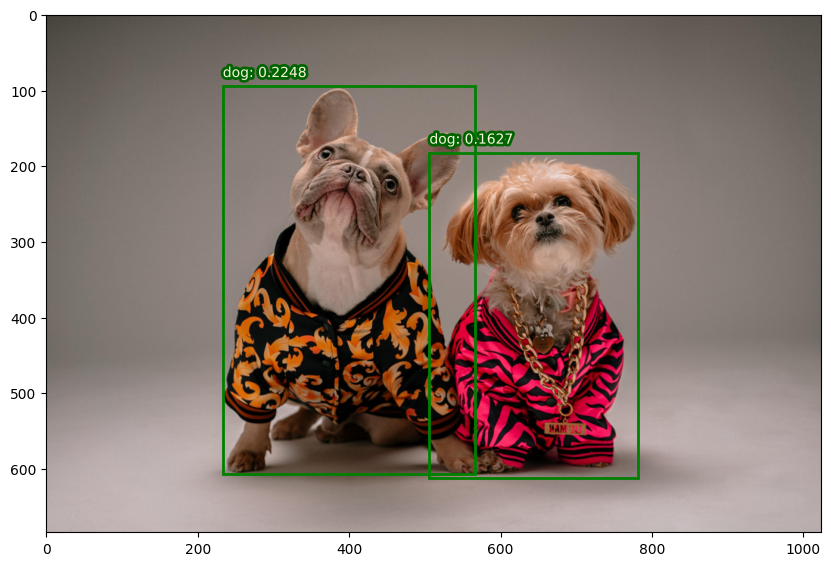

In [8]:
# Use the util's function to prompt boxes in top of the image.
# preprocess_outputs, show_boxes_and_labels_on_image

# Preprocess the outputs
input_scores, input_labels, input_boxes = preprocess_outputs(detector_output)

# Show the image with the bounding boxes
show_boxes_and_labels_on_image(
    # raw_image,
    resized_image,
    input_boxes[0],
    input_labels,
    input_scores,
)

## **Image Segmentation:** using [SAM (Segment Any Model)](https://segment-anything.com/) : FastSAM, MobileSAM
Common ways to generate seg marks:
> - Method 1: Manual Creation
> - Method 2: Using OpenCV for Simple Cases
> - Method 3: Semi-Automatic Creation Using Tools
> - Method 4: SAM Models (positive + negative prompt)

In [9]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.3/41.3 kB 1.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 869.1/869.1 kB 15.9 MB/s eta 0:00:00


In [14]:
# SAM: can be prompted: input points and pixel coordinates

# Load FastSAM from ultralytics
from ultralytics import YOLO, SAM

# SAM version
# mobile_sam_model = "sam.pt" # Original SAM: More computation required ~ GPUs
FastSAM_model   = "FastSAM.pt"
mobileSAM_model = "mobile_sam.pt"

# Load the model
# model = YOLO(FastSAM_model)
segmenter = SAM(mobileSAM_model)

# device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# segmenter.to(device)

# print(segmenter)

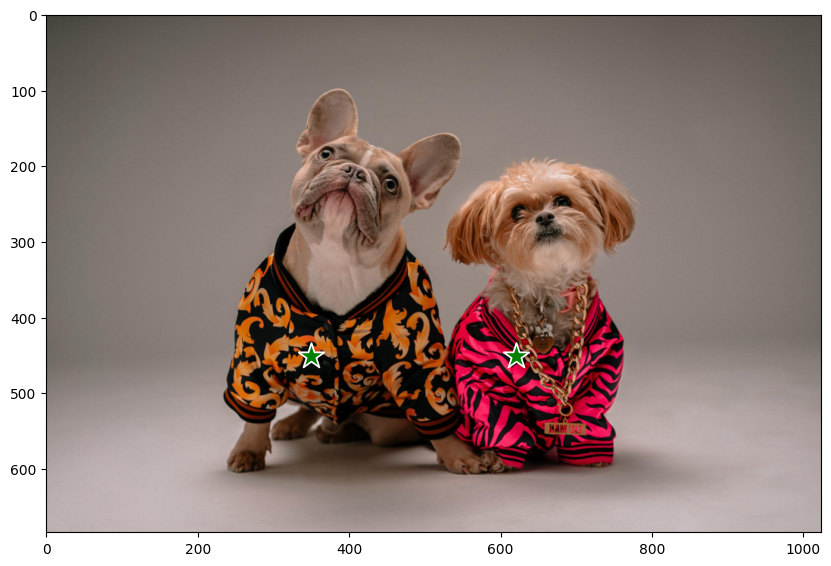

In [15]:
# Function written in the utils file
from utils_im_seg import resize_image, show_points_on_image

# Specify two points in the same image
# [x_axis, y_axis]
input_points = [ [350, 450], [620, 450] ]

# show_points_on_image(raw_image, input_points)
show_points_on_image(resized_image, input_points)


In [16]:
from utils_im_seg import show_masks_on_image

# Create a list of positive labels of same length as the number of predictions generated above
labels = np.repeat(1, len(detector_output))
print(labels)

# Run the model
result = segmenter.predict(
    # raw_image,
    resized_image,
    bboxes=input_boxes[0],
    labels=labels
)

masks = result[0].masks.data
print(masks)


[1 1]

0: 1024x1024 95.1ms
Speed: 4.9ms preprocess, 95.1ms inference, 0.3ms postprocess per image at shape (1, 3, 1024, 1024)
tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]], device='cuda:0')


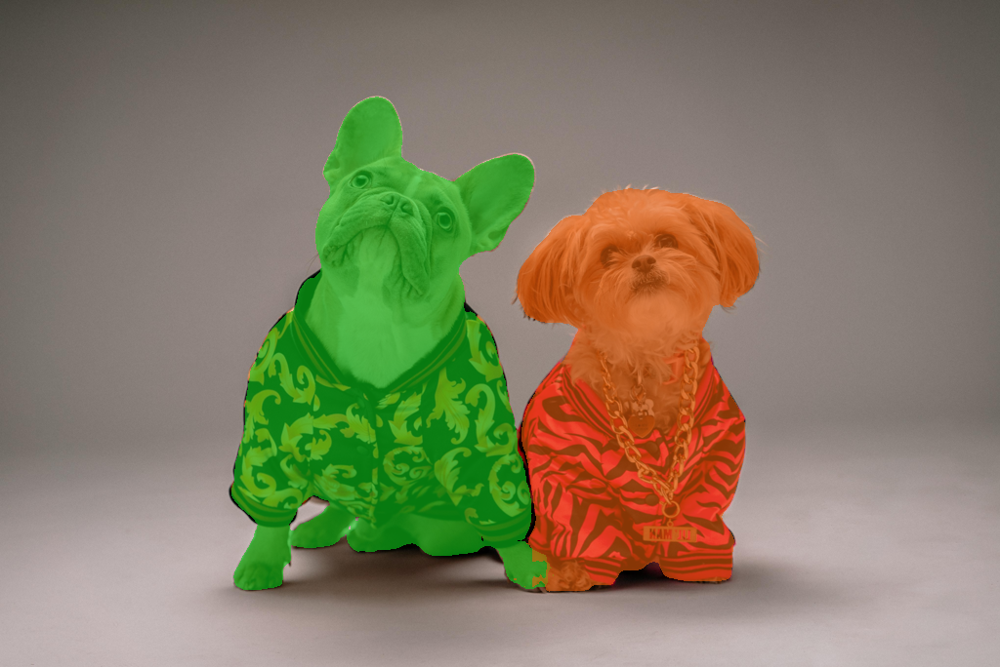

In [17]:
# Visualize the masks
show_masks_on_image(
    # raw_image,
    resized_image,
    # masks
    masks.cpu().numpy(), # Move the tensor to CPU and convert to NumPy array
)

> ### **NOTES:** We have a pipeline to go directly from `text` to a `masked image`
- We can use these masks to dynamically perform further operations in the original image such as: **blurring, repairing damaged regions, replacing a specific object from the image**.


**Visualizing Masks based on input_boxes**

input_boxes [[[233, 94, 566, 607], [506, 182, 782, 612]]]
obj1: [233, 94, 566, 607]


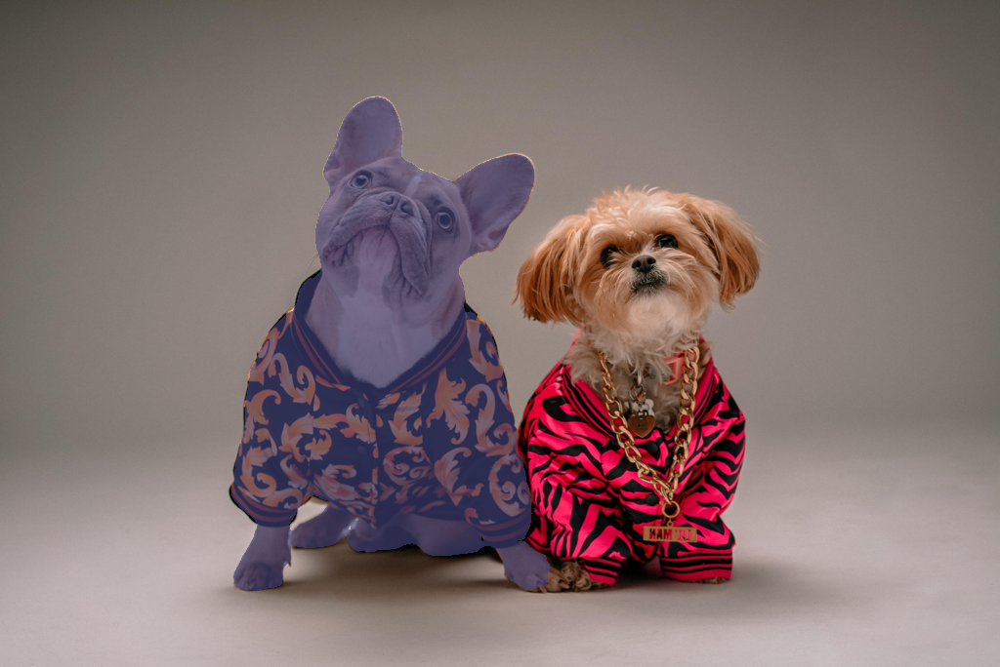

In [18]:
from utils_im_seg import box_prompt
print("input_boxes", input_boxes)

OBJ_ID = 1  # first object: i.e dog1
masks_boxes_1 = process_mask_input_boxes(input_boxes, masks, OBJ_ID)
show_masks_on_image(resized_image, [masks_boxes_1])

obj2: [506, 182, 782, 612]


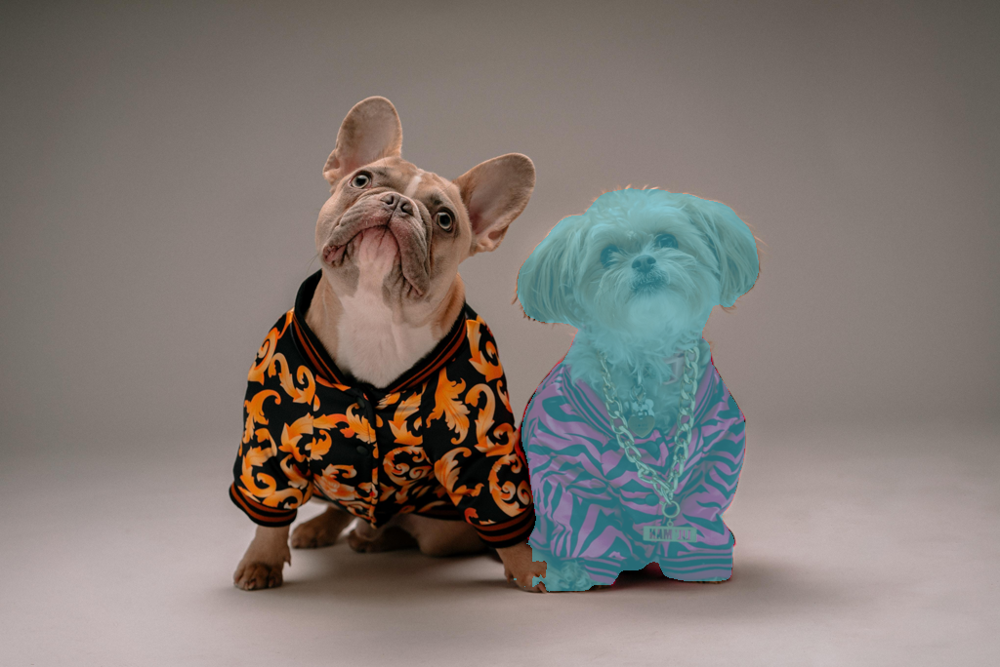

In [19]:
OBJ_ID = 2
masks_boxes_2 = process_mask_input_boxes(input_boxes, masks, OBJ_ID)
show_masks_on_image(resized_image, [masks_boxes_2])

**Save the masks into binary mask format**

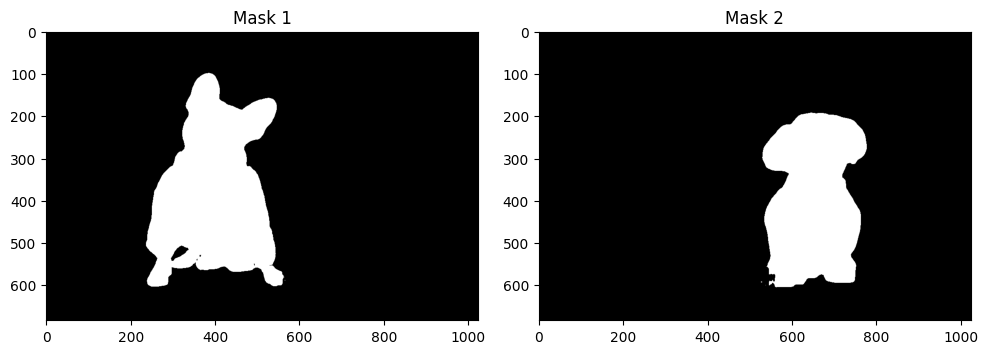

In [20]:
# To visualize, import matplotlib
from matplotlib import colormaps

# Plot the binary mask of both images
# Create a figure and a set of subplots
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Display masks in subplots
axes[0].imshow(masks_boxes_1, cmap='gray')
axes[0].set_title('Mask 1')
axes[1].imshow(masks_boxes_2, cmap='gray')
axes[1].set_title('Mask 2')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

# print(list(colormaps))
# print(colormaps)

In [21]:
# Save masked images
save_mask(masks_boxes_1, "dog1.png")
save_mask(masks_boxes_2, "dog2.png")

## **Image Editing** using [Diffusion Models](https://huggingface.co/docs/diffusers/index)
> - **Goal** `Replace the dog 2 (on the right) by a Cat`

### Load Images

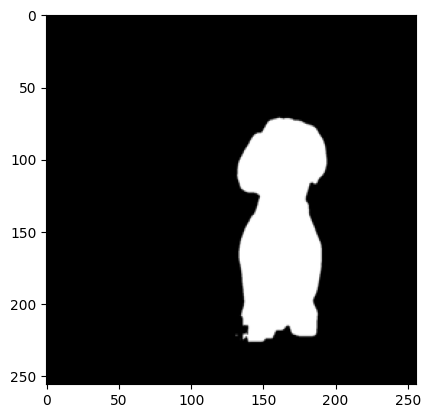

In [22]:
# Original Image
image=Image.open("dogs.jpg").resize((256, 256))
# Segmented Masks
image_mask=Image.open("dog2.png").resize((256, 256))


# Print the image
# plt.imshow(image)

# Print the mask of the object we want to edit: blur, replace, repair ...
plt.imshow(image_mask)


### Load and Prepare the model

In [38]:
import torch
from diffusers import StableDiffusionInpaintPipeline

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
diffuser_id = "stabilityai/stable-diffusion-2-inpainting"

sd_pipe = StableDiffusionInpaintPipeline.from_pretrained(
    diffuser_id,
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.bfloat16,
    low_cpu_mem_usage=False if torch.cuda.is_available() else True,
).to(device)

# print(sd_pipe)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

In [39]:
# Set the value of seed manually for reproducibility of the results
seed = 66733
generator = torch.Generator(device).manual_seed(seed)

In [40]:
prompt = "a realistic Cat"
# prompt = "a realistic Cat standing on ther floor"
# prompt = "a realistic Cat standing on ther floor looking at the camera"
# prompt = "a realistic Cat standing on ther floor wearing glasses"

### **Notice
**

**Hardware requirements:**
- To generate the images, a machine with at least 8 GB of CPU should suffice:
  - You can expect results within approximately 3 minutes for 3 inference steps.
  - However, for tasks involving 10 steps, using a CPU may extend the execution time to about 10 minutes.
  - Tasks involving 100 steps will significantly prolong the execution time on a CPU.
- Alternatively, consider utilizing a GPU for faster processing. With a GPU, all three steps can be completed in under 1 second.

In [41]:
output = sd_pipe(
  image=image,
  mask_image=image_mask,
  prompt=prompt,
  generator=generator,
  num_inference_steps=3,
)
generated_image = output.images[0]

  0%|          | 0/3 [00:00<?, ?it/s]

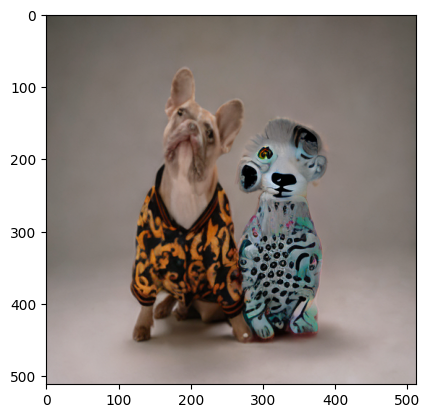

In [42]:
import io
import matplotlib.pyplot as plt
from PIL import Image
# plt.imshow(Image.open(io.BytesIO(reference_image)))
# plt.imshow(Image.open(io.BytesIO(generated_image)))
plt.imshow(generated_image)

**Notes:** the dog2* is replaced, however the outcome isn't that good!!! As a result we can tuning our diffusion model to improve the final outcome.

### Diffuser Tuning
- Number of inference steps
- Guidance scale
- Strength

**Number inference of steps:** increases the de-noising process of the image

In [43]:
num_inference_steps = 100 if torch.cuda.is_available() else 10
# num_inference_steps = 200 if torch.cuda.is_available() else 10

In [44]:
output = sd_pipe(
  image=image,
  mask_image=image_mask,
  prompt=prompt,
  generator=generator,
  num_inference_steps=num_inference_steps,
)
generated_image = output.images[0]

  0%|          | 0/100 [00:00<?, ?it/s]

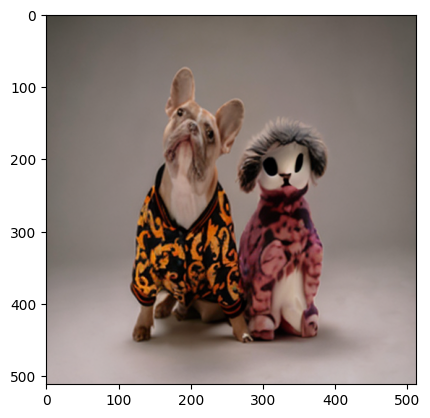

In [45]:
plt.imshow(generated_image)

**Guidance Scale:** tells the diffuser how closer it should follow the prompt (high: higher prompt fidelity, but lower image quality...)

In [46]:
guidance_scale_values = [x for x in np.arange(0, 21, 10)]

for guidance_scale in guidance_scale_values:
    output = sd_pipe(
      image=image,
      mask_image=image_mask,
      prompt=prompt,
      generator=generator,
      num_inference_steps=num_inference_steps,
      guidance_scale=guidance_scale,

    )

generated_image = output.images[0]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

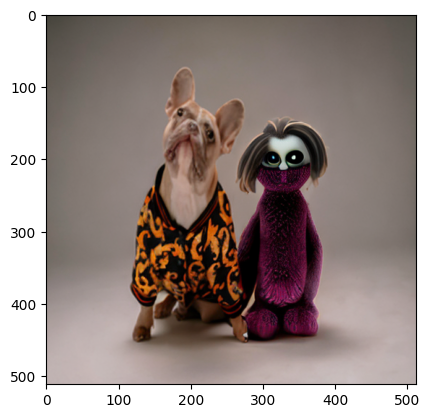

In [47]:
plt.imshow(generated_image)

**Strength**: determines how much noise gets added

In [48]:
strength_values = [x for x in np.arange(0.1, 1.1, 0.2)]
for strength in strength_values:

    output = sd_pipe(
      image=image,
      mask_image=image_mask,
      prompt=prompt,
      generator=generator,
      num_inference_steps=num_inference_steps,
      strength=strength
    )

generated_image = output.images[0]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/70 [00:00<?, ?it/s]

  0%|          | 0/90 [00:00<?, ?it/s]

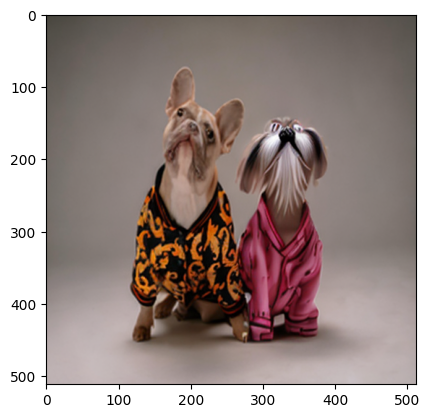

In [49]:
plt.imshow(generated_image)

**Try adding a Negative Prompt**
- If you set the negative prompt to "cartoon", this is asking the image generation model to not generate an image that looks like a cartoon.
- Again, the image generation code is best run on a GPU.

In [50]:

prompt = "a realistic cat"
negative_prompt = "cartoon"

num_inference_steps = 100 if torch.cuda.is_available() else 10

output = sd_pipe(
  image=image,
  mask_image=image_mask,
  prompt=prompt,
  negative_prompt=negative_prompt,
  generator=generator,
  num_inference_steps=num_inference_steps,
  guidance_scale=10
)

generated_image = output.images[0]

  0%|          | 0/100 [00:00<?, ?it/s]

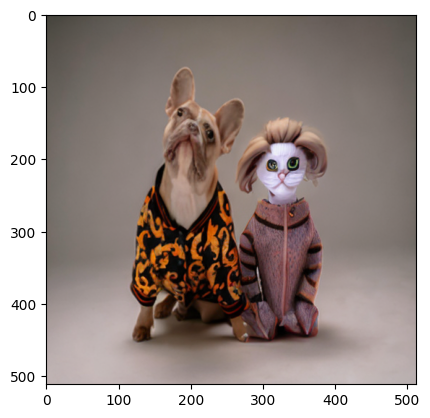

In [51]:
plt.imshow(generated_image)

## Save the brand new image!!!

In [52]:
# Assuming 'generated_image' is a NumPy array representing the image
plt.imshow(generated_image)
plt.axis('off')  # Hide axes
plt.savefig("generated_image.png", bbox_inches='tight', pad_inches=0)
plt.close()  # Close the plot to release resources

## References

**Docs:**

- [AI Image Restoration](https://en.wikipedia.org/wiki/Image_restoration_by_artificial_intelligence)
- [HF Inpainting Doc](https://huggingface.co/docs/diffusers/api/pipelines/stable_diffusion/inpaint)
- [Vision Prompting Notes - DeepLearning AI](https://github.com/afondiel/Prompt-Engineering-for-Vision-Models-DeepLearningAI/tree/main)

**Datasets:**

- [Popular Inpainting Datasets](https://paperswithcode.com/datasets?task=image-inpainting)

**Models:**

- [SOTA Models for Inpainting](https://paperswithcode.com/task/image-inpainting)

**Papers**
- [GradPaint: Gradient-Guided Inpainting with Diffusion Models](https://arxiv.org/pdf/2309.09614)
